# COVID-19: ANALYSIS AND VISUALISATION

Coronavirus disease 2019 (COVID-19) is an infectious disease caused by severe acute respiratory syndrome coronavirus 2 (SARS-CoV-2). It was first identified in December 2019 in Wuhan, Hubei, China, and has resulted in an ongoing pandemic.

<img src = 'https://upload.wikimedia.org/wikipedia/commons/thumb/7/76/Novel_Coronavirus_SARS-CoV-2.jpg/250px-Novel_Coronavirus_SARS-CoV-2.jpg'/>

In this project we are going to analyse the data from various countries regarding the number of cases and will be gaining some interesting insights. We will be using <b>SQL</b> to query our data and many <b>Python libraries<b/> for interpreting and analysing the data and visualizing it.

## Importing the  Libraries
In this section we will be importing the required that will be used in this project. These libraries have various in-built functions and classes that makes our work easy.

In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

In [2]:
%matplotlib inline

In [3]:
from plotly import __version__
from plotly.offline import download_plotlyjs, init_notebook_mode, plot, iplot

print(__version__)

4.8.2


In [4]:
import plotly.express as px
import pycountry

In [5]:
import cufflinks as cf
init_notebook_mode(connected=True)
cf.go_offline()

In [6]:
import sqlite3
%load_ext sql
%sql sqlite:///testdb.sqlite

In [7]:
conn = sqlite3.connect("testdb.sqlite")


## Data Preparation 

In this section we will be importing the required datasets for our project and perform some cleaning and joining operations on our data. Data Preparation is the most important step in any kind of data analysis. After this part our data will be ready for analysis.

In [8]:
data_url = "https://raw.githubusercontent.com/datasets/covid-19/master/data/countries-aggregated.csv"
# this url is updated regularly and gives us the latest data.

In [9]:
cumm_data = pd.read_csv(data_url,parse_dates = ['Date'])

In [10]:
cumm_data.head(10)

,Date,Country,Confirmed,Recovered,Deaths
0,2020-01-22,Afghanistan,0,0,0
1,2020-01-22,Albania,0,0,0
2,2020-01-22,Algeria,0,0,0
3,2020-01-22,Andorra,0,0,0
4,2020-01-22,Angola,0,0,0
5,2020-01-22,Antigua and Barbuda,0,0,0
6,2020-01-22,Argentina,0,0,0
7,2020-01-22,Armenia,0,0,0
8,2020-01-22,Australia,0,0,0
9,2020-01-22,Austria,0,0,0


In [11]:
cumm_data[cumm_data.Country == 'Afghanistan']

,Date,Country,Confirmed,Recovered,Deaths
0,2020-01-22,Afghanistan,0,0,0
188,2020-01-23,Afghanistan,0,0,0
376,2020-01-24,Afghanistan,0,0,0
564,2020-01-25,Afghanistan,0,0,0
752,2020-01-26,Afghanistan,0,0,0
...,...,...,...,...,...
33276,2020-07-17,Afghanistan,35229,23151,1147
33464,2020-07-18,Afghanistan,35301,23273,1164
33652,2020-07-19,Afghanistan,35475,23634,1181
33840,2020-07-20,Afghanistan,35526,23741,1185


### <i>As the data is cummulative we need to convert in into such a form that gives us information about everyday increment.<i/>

In [12]:
countries = cumm_data['Country'].unique()

In [13]:
countries

array(['Afghanistan', 'Albania', 'Algeria', 'Andorra', 'Angola',
       'Antigua and Barbuda', 'Argentina', 'Armenia', 'Australia',
       'Austria', 'Azerbaijan', 'Bahamas', 'Bahrain', 'Bangladesh',
       'Barbados', 'Belarus', 'Belgium', 'Belize', 'Benin', 'Bhutan',
       'Bolivia', 'Bosnia and Herzegovina', 'Botswana', 'Brazil',
       'Brunei', 'Bulgaria', 'Burkina Faso', 'Burma', 'Burundi',
       'Cabo Verde', 'Cambodia', 'Cameroon', 'Canada',
       'Central African Republic', 'Chad', 'Chile', 'China', 'Colombia',
       'Comoros', 'Congo (Brazzaville)', 'Congo (Kinshasa)', 'Costa Rica',
       "Cote d'Ivoire", 'Croatia', 'Cuba', 'Cyprus', 'Czechia', 'Denmark',
       'Diamond Princess', 'Djibouti', 'Dominica', 'Dominican Republic',
       'Ecuador', 'Egypt', 'El Salvador', 'Equatorial Guinea', 'Eritrea',
       'Estonia', 'Eswatini', 'Ethiopia', 'Fiji', 'Finland', 'France',
       'Gabon', 'Gambia', 'Georgia', 'Germany', 'Ghana', 'Greece',
       'Grenada', 'Guatemala', 'Guin

In [14]:
da = cumm_data[cumm_data['Country'] == 'Afghanistan']
da

,Date,Country,Confirmed,Recovered,Deaths
0,2020-01-22,Afghanistan,0,0,0
188,2020-01-23,Afghanistan,0,0,0
376,2020-01-24,Afghanistan,0,0,0
564,2020-01-25,Afghanistan,0,0,0
752,2020-01-26,Afghanistan,0,0,0
...,...,...,...,...,...
33276,2020-07-17,Afghanistan,35229,23151,1147
33464,2020-07-18,Afghanistan,35301,23273,1164
33652,2020-07-19,Afghanistan,35475,23634,1181
33840,2020-07-20,Afghanistan,35526,23741,1185


In [15]:
da['Confirmed'] = da['Confirmed'] - da['Confirmed'].shift(1)
da['Recovered'] = da['Recovered'] - da['Recovered'].shift(1)
da['Deaths'] = da['Deaths'] - da['Deaths'].shift(1)
da.dropna(inplace = True)

#coverting cummulative data into everyday data

da

,Date,Country,Confirmed,Recovered,Deaths
188,2020-01-23,Afghanistan,0.0,0.0,0.0
376,2020-01-24,Afghanistan,0.0,0.0,0.0
564,2020-01-25,Afghanistan,0.0,0.0,0.0
752,2020-01-26,Afghanistan,0.0,0.0,0.0
940,2020-01-27,Afghanistan,0.0,0.0,0.0
...,...,...,...,...,...
33276,2020-07-17,Afghanistan,159.0,327.0,34.0
33464,2020-07-18,Afghanistan,72.0,122.0,17.0
33652,2020-07-19,Afghanistan,174.0,361.0,17.0
33840,2020-07-20,Afghanistan,51.0,107.0,4.0


In [16]:
for country in countries[1:]:
    d = cumm_data[cumm_data['Country'] == country]
    d['Confirmed'] = d['Confirmed'] - d['Confirmed'].shift(1)
    d['Recovered'] = d['Recovered'] - d['Recovered'].shift(1)
    d['Deaths'] = d['Deaths'] - d['Deaths'].shift(1)
    da = da.append(d)

In [17]:
da.dropna(inplace = True)

In [18]:
data = da.astype({'Confirmed':int,'Deaths':int,'Recovered':int})

In [19]:
data

,Date,Country,Confirmed,Recovered,Deaths
188,2020-01-23,Afghanistan,0,0,0
376,2020-01-24,Afghanistan,0,0,0
564,2020-01-25,Afghanistan,0,0,0
752,2020-01-26,Afghanistan,0,0,0
940,2020-01-27,Afghanistan,0,0,0
...,...,...,...,...,...
33463,2020-07-17,Zimbabwe,58,13,1
33651,2020-07-18,Zimbabwe,58,1,1
33839,2020-07-19,Zimbabwe,133,33,0
34027,2020-07-20,Zimbabwe,102,0,1


In [20]:
pop_data = pd.read_csv('population_data.csv')
pop_data.head(10)

,Country (or dependency),Population (2020),Yearly Change,Net Change,Density (P/Km²),Land Area (Km²),Migrants (net),Fert. Rate,Med. Age,Urban Pop %,World Share
0,China,1438207241,0.39 %,5540090,153,9388211,-348399.0,1.7,38,61 %,18.47 %
1,India,1377233523,0.99 %,13586631,464,2973190,-532687.0,2.2,28,35 %,17.70 %
2,United States,330610570,0.59 %,1937734,36,9147420,954806.0,1.8,38,83 %,4.25 %
3,Indonesia,272931713,1.07 %,2898047,151,1811570,-98955.0,2.3,30,56 %,3.51 %
4,Pakistan,219992900,2.00 %,4327022,287,770880,-233379.0,3.6,23,35 %,2.83 %
5,Brazil,212253150,0.72 %,1509890,25,8358140,21200.0,1.7,33,88 %,2.73 %
6,Nigeria,205052107,2.58 %,5175990,226,910770,-60000.0,5.4,18,52 %,2.64 %
7,Bangladesh,164354176,1.01 %,1643222,1265,130170,-369501.0,2.1,28,39 %,2.11 %
8,Russia,145922010,0.04 %,62206,9,16376870,182456.0,1.8,40,74 %,1.87 %
9,Mexico,128655589,1.06 %,1357224,66,1943950,-60000.0,2.1,29,84 %,1.65 %


In [21]:
pop_data = pop_data.set_index('Country (or dependency)')['Population (2020)']
pop_data.head(10)

Country (or dependency)
China            1438207241
India            1377233523
United States     330610570
Indonesia         272931713
Pakistan          219992900
Brazil            212253150
Nigeria           205052107
Bangladesh        164354176
Russia            145922010
Mexico            128655589
Name: Population (2020), dtype: int64

In [22]:
countrywise_data = data.groupby('Country').sum()
countrywise_data

,Confirmed,Recovered,Deaths
Country,,,
Afghanistan,35615,23741,1186
Albania,4290,2397,117
Algeria,24278,16646,1100
Andorra,884,803,52
Angola,779,221,30
...,...,...,...
West Bank and Gaza,9228,1932,64
Western Sahara,10,8,1
Yemen,1629,741,456


In [23]:
countrywise_data=countrywise_data.join(pop_data,how = 'left')

In [24]:
countrywise_data

,Confirmed,Recovered,Deaths,Population (2020)
Country,,,,
Afghanistan,35615,23741,1186,38742911.0
Albania,4290,2397,117,2878420.0
Algeria,24278,16646,1100,43685618.0
Andorra,884,803,52,77240.0
Angola,779,221,30,32644783.0
...,...,...,...,...
West Bank and Gaza,9228,1932,64,NaN
Western Sahara,10,8,1,594215.0
Yemen,1629,741,456,29687214.0


In [25]:
countrywise_data[countrywise_data['Population (2020)'].isnull()]

,Confirmed,Recovered,Deaths,Population (2020)
Country,,,,
Burma,341,280,6,NaN
Congo (Brazzaville),2851,666,50,NaN
Congo (Kinshasa),8534,4528,196,NaN
Cote d'Ivoire,14531,8857,93,NaN
Czechia,14324,8918,360,NaN
Diamond Princess,712,651,13,NaN
"Korea, South",13878,12698,297,NaN
Kosovo,5877,3069,139,NaN
MS Zaandam,9,0,2,NaN


### <i> So, we see some of the values of population are null. We either need to drop these rows or fill them with appropriate values.</i>

In [26]:
print(sorted(np.array(pop_data.index)))

['Afghanistan', 'Albania', 'Algeria', 'American Samoa', 'Andorra', 'Angola', 'Anguilla', 'Antigua and Barbuda', 'Argentina', 'Armenia', 'Aruba', 'Australia', 'Austria', 'Azerbaijan', 'Bahamas', 'Bahrain', 'Bangladesh', 'Barbados', 'Belarus', 'Belgium', 'Belize', 'Benin', 'Bermuda', 'Bhutan', 'Bolivia', 'Bosnia and Herzegovina', 'Botswana', 'Brazil', 'British Virgin Islands', 'Brunei', 'Bulgaria', 'Burkina Faso', 'Burundi', 'Cabo Verde', 'Cambodia', 'Cameroon', 'Canada', 'Caribbean Netherlands', 'Cayman Islands', 'Central African Republic', 'Chad', 'Channel Islands', 'Chile', 'China', 'Colombia', 'Comoros', 'Congo', 'Cook Islands', 'Costa Rica', 'Croatia', 'Cuba', 'Curaçao', 'Cyprus', 'Czech Republic (Czechia)', "Côte d'Ivoire", 'DR Congo', 'Denmark', 'Djibouti', 'Dominica', 'Dominican Republic', 'Ecuador', 'Egypt', 'El Salvador', 'Equatorial Guinea', 'Eritrea', 'Estonia', 'Eswatini', 'Ethiopia', 'Faeroe Islands', 'Falkland Islands', 'Fiji', 'Finland', 'France', 'French Guiana', 'French

In [27]:
pop_data['United States']

330610570

In [28]:
countrywise_data.loc['US','Population (2020)'] = pop_data['United States']
countrywise_data.loc['Taiwan*','Population (2020)'] = pop_data['Taiwan']
countrywise_data.loc['Korea, South','Population (2020)'] = pop_data['South Korea']

In [29]:
countrywise_data.loc['Burma','Population (2020)'] = pop_data['Myanmar']
countrywise_data.loc['Congo',:] = countrywise_data.loc['Congo (Brazzaville)',:] + countrywise_data.loc['Congo (Kinshasa)',:]
countrywise_data.loc['Congo','Population (2020)'] = pop_data['Congo']

In [30]:
countrywise_data.loc['Czechia','Population (2020)'] = pop_data['Czech Republic (Czechia)']
countrywise_data.loc["Cote d'Ivoire",'Population (2020)'] = pop_data["Côte d'Ivoire"]
countrywise_data.loc["Kosovo",'Population (2020)'] = 1810463 # source- Wikipedia   https://en.wikipedia.org/wiki/Kosovo
countrywise_data.loc["Saint Kitts and Nevis",'Population (2020)'] = pop_data['Saint Kitts & Nevis']

In [31]:
countrywise_data.loc['Saint Vincent and the Grenadines','Population (2020)'] = pop_data['St. Vincent & Grenadines']
countrywise_data.loc['Sao Tome and Principe','Population (2020)'] = pop_data['Sao Tome & Principe']
countrywise_data.loc['West Bank and Gaza','Population (2020)'] = 4685306 #source - WorldBank  https://data.worldbank.org/country/PS

In [32]:
countrywise_data[countrywise_data['Population (2020)'].isnull()]

,Confirmed,Recovered,Deaths,Population (2020)
Country,,,,
Congo (Brazzaville),2851.0,666.0,50.0,NaN
Congo (Kinshasa),8534.0,4528.0,196.0,NaN
Diamond Princess,712.0,651.0,13.0,NaN
MS Zaandam,9.0,0.0,2.0,NaN


### <i> The first two are added in Congo and the last two are cruise ships so they can be excluded. Hence we can drop all these rows</i>

In [33]:
countrywise_data=countrywise_data.dropna().sort_index()

In [34]:
countrywise_data = countrywise_data.astype({'Confirmed':int,'Recovered':int,'Deaths':int,'Population (2020)':int})

In [35]:
countrywise_data.head()

,Confirmed,Recovered,Deaths,Population (2020)
Country,,,,
Afghanistan,35615,23741,1186,38742911
Albania,4290,2397,117,2878420
Algeria,24278,16646,1100,43685618
Andorra,884,803,52,77240
Angola,779,221,30,32644783


In [36]:
countrywise_data['Country'] = countrywise_data.index
countrywise_data = countrywise_data[['Country','Confirmed','Recovered','Deaths','Population (2020)']]
countrywise_data.index = np.arange(len(countrywise_data))
countrywise_data

,Country,Confirmed,Recovered,Deaths,Population (2020)
0,Afghanistan,35615,23741,1186,38742911
1,Albania,4290,2397,117,2878420
2,Algeria,24278,16646,1100,43685618
3,Andorra,884,803,52,77240
4,Angola,779,221,30,32644783
...,...,...,...,...,...
180,West Bank and Gaza,9228,1932,64,4685306
181,Western Sahara,10,8,1,594215
182,Yemen,1629,741,456,29687214
183,Zambia,3386,1620,128,18273379


### <i> So the three data tables we have prepared and will be using in this analysis are given below.</i>

In [37]:
data = data.reset_index(drop = True)
data

,Date,Country,Confirmed,Recovered,Deaths
0,2020-01-23,Afghanistan,0,0,0
1,2020-01-24,Afghanistan,0,0,0
2,2020-01-25,Afghanistan,0,0,0
3,2020-01-26,Afghanistan,0,0,0
4,2020-01-27,Afghanistan,0,0,0
...,...,...,...,...,...
34023,2020-07-17,Zimbabwe,58,13,1
34024,2020-07-18,Zimbabwe,58,1,1
34025,2020-07-19,Zimbabwe,133,33,0
34026,2020-07-20,Zimbabwe,102,0,1


In [38]:
countrywise_data

,Country,Confirmed,Recovered,Deaths,Population (2020)
0,Afghanistan,35615,23741,1186,38742911
1,Albania,4290,2397,117,2878420
2,Algeria,24278,16646,1100,43685618
3,Andorra,884,803,52,77240
4,Angola,779,221,30,32644783
...,...,...,...,...,...
180,West Bank and Gaza,9228,1932,64,4685306
181,Western Sahara,10,8,1,594215
182,Yemen,1629,741,456,29687214
183,Zambia,3386,1620,128,18273379


In [39]:
cumm_data

,Date,Country,Confirmed,Recovered,Deaths
0,2020-01-22,Afghanistan,0,0,0
1,2020-01-22,Albania,0,0,0
2,2020-01-22,Algeria,0,0,0
3,2020-01-22,Andorra,0,0,0
4,2020-01-22,Angola,0,0,0
...,...,...,...,...,...
34211,2020-07-21,West Bank and Gaza,9228,1932,64
34212,2020-07-21,Western Sahara,10,8,1
34213,2020-07-21,Yemen,1629,741,456
34214,2020-07-21,Zambia,3386,1620,128


## Exploring our Data: Analysing Latest Numbers from Different Countries

Now it's the time to beign our analysis and gain some interesting insights from our data. We will be comparing data from different countries and interpreting it to our requirement. 

In [40]:
countrywise_data.to_sql("countrywise_data", conn, index=False, if_exists="replace")

C:\Users\sanch\anaconda3\lib\site-packages\pandas\core\generic.py:2663: UserWarning:

The spaces in these column names will not be changed. In pandas versions < 0.14, spaces were converted to underscores.



In [41]:
%%sql
SELECT * FROM countrywise_data

 * sqlite:///testdb.sqlite
Done.


Country,Confirmed,Recovered,Deaths,Population (2020)
Afghanistan,35615,23741,1186,38742911
Albania,4290,2397,117,2878420
Algeria,24278,16646,1100,43685618
Andorra,884,803,52,77240
Angola,779,221,30,32644783
Antigua and Barbuda,76,57,3,97764
Argentina,136118,58598,2490,45111229
Armenia,35254,24206,662,2962137
Australia,12894,8545,128,25439164
Austria,19827,17716,710,8996022


### <i>Top 20 countries with most number of cases:</i>

In [42]:
%%sql

SELECT * FROM countrywise_data
ORDER BY Confirmed DESC
LIMIT 20

 * sqlite:///testdb.sqlite
Done.


Country,Confirmed,Recovered,Deaths,Population (2020)
US,3899210,1182018,141995,330610570
Brazil,2159654,1555339,81487,212253150
India,1193078,753050,28732,1377233523
Russia,782040,561397,12561,145922010
South Africa,381798,208144,5368,59154802
Peru,362087,248746,13579,32876986
Mexico,356255,267407,40400,128655589
Chile,334683,306816,8677,19082804
United Kingdom,297389,1414,45507,67814098
Iran,278827,242351,14634,83771587


### <i>Top 20 Countries with Most Number of Deaths:</i>

In [43]:
%%sql

SELECT * FROM countrywise_data
ORDER BY Deaths DESC
LIMIT 20

 * sqlite:///testdb.sqlite
Done.


Country,Confirmed,Recovered,Deaths,Population (2020)
US,3899210,1182018,141995,330610570
Brazil,2159654,1555339,81487,212253150
United Kingdom,297389,1414,45507,67814098
Mexico,356255,267407,40400,128655589
Italy,244752,197431,35073,60479424
France,214607,79861,30168,65244628
India,1193078,753050,28732,1377233523
Spain,266194,150376,28424,46751175
Iran,278827,242351,14634,83771587
Peru,362087,248746,13579,32876986


### <i>Top 20 Countries with Most Number of Active Cases:<i/>

Active cases represent those people that have  not recovered and still fighting with the disease.

In [44]:
%%sql

SELECT *,Confirmed - (Recovered + Deaths) AS Active
FROM countrywise_data
ORDER BY Active DESC
LIMIT 20

 * sqlite:///testdb.sqlite
Done.


Country,Confirmed,Recovered,Deaths,Population (2020),Active
US,3899210,1182018,141995,330610570,2575197
Brazil,2159654,1555339,81487,212253150,522828
India,1193078,753050,28732,1377233523,411296
United Kingdom,297389,1414,45507,67814098,250468
Russia,782040,561397,12561,145922010,208082
South Africa,381798,208144,5368,59154802,168286
Colombia,211038,98840,7166,50771878,105032
France,214607,79861,30168,65244628,104578
Peru,362087,248746,13579,32876986,99762
Bangladesh,210510,115397,2709,164354176,92404


### <i> Recovery Rate and Death Rate of Different Countries: </i>

In [45]:
%%sql

SELECT Country,Confirmed,Recovered,Deaths, ROUND(CAST(Recovered AS FLOAT)*100/Confirmed,2) AS "Recovery Rate(%)",
ROUND(CAST(Deaths AS FLOAT)*100/Confirmed,2) AS "Death Rate(%)"
FROM countrywise_data
ORDER BY Confirmed DESC

 * sqlite:///testdb.sqlite
Done.


Country,Confirmed,Recovered,Deaths,Recovery Rate(%),Death Rate(%)
US,3899210,1182018,141995,30.31,3.64
Brazil,2159654,1555339,81487,72.02,3.77
India,1193078,753050,28732,63.12,2.41
Russia,782040,561397,12561,71.79,1.61
South Africa,381798,208144,5368,54.52,1.41
Peru,362087,248746,13579,68.7,3.75
Mexico,356255,267407,40400,75.06,11.34
Chile,334683,306816,8677,91.67,2.59
United Kingdom,297389,1414,45507,0.48,15.3
Iran,278827,242351,14634,86.92,5.25


### <i>Confirmed cases and Deaths as Percentage of the Whole World:<i/>

In [ ]:
%%sql
SELECT Country, Confirmed, 
ROUND(Confirmed*100/(SELECT CAST(SUM(Confirmed) AS FLOAT) from countrywise_data),2) AS '%Confirmed',
Deaths,
ROUND(Deaths*100/(SELECT CAST(SUM(Deaths) AS FLOAT) from countrywise_data),2) AS '%Deaths'
FROM countrywise_data
ORDER BY Confirmed DESC

So, We can see that as on July 20:
- around 26% of the cases have come from only US
- more than 53% have come from top 4 Countries
- around 50% deaths have come from top 7 Countries

### <i>Cases Per Million of the Population:<i/>

Ordering by number of Confirmed cases:

In [46]:
%%sql

SELECT Country,Confirmed,`Population (2020)`,
(Confirmed*1000000)/`Population (2020)`AS Cases_per_million
FROM countrywise_data
ORDER BY Confirmed DESC


 * sqlite:///testdb.sqlite
Done.


Country,Confirmed,Population (2020),Cases_per_million
US,3899210,330610570,11793
Brazil,2159654,212253150,10174
India,1193078,1377233523,866
Russia,782040,145922010,5359
South Africa,381798,59154802,6454
Peru,362087,32876986,11013
Mexico,356255,128655589,2769
Chile,334683,19082804,17538
United Kingdom,297389,67814098,4385
Iran,278827,83771587,3328


Ordering by cases per million population (Descending Order):

In [47]:
%%sql

SELECT Country,Confirmed,`Population (2020)`,
(Confirmed*1000000)/`Population (2020)`AS Cases_per_million
FROM countrywise_data
ORDER BY Cases_per_million DESC


 * sqlite:///testdb.sqlite
Done.


Country,Confirmed,Population (2020),Cases_per_million
Qatar,107430,2870922,37420
Bahrain,37316,1688629,22098
San Marino,699,33917,20609
Chile,334683,19082804,17538
Holy See,12,801,14981
Kuwait,60434,4257495,14194
Oman,69887,5078933,13760
Panama,55153,4300667,12824
Armenia,35254,2962137,11901
US,3899210,330610570,11793


Ordering by cases per million population:

In [48]:
%%sql

SELECT Country,Confirmed,`Population (2020)`,
(Confirmed*1000000)/`Population (2020)`AS Cases_per_million
FROM countrywise_data
ORDER BY Cases_per_million 

 * sqlite:///testdb.sqlite
Done.


Country,Confirmed,Population (2020),Cases_per_million
Laos,19,7253719,2
Papua New Guinea,27,8911530,3
Vietnam,401,97160127,4
Burma,341,54335948,6
Tanzania,509,59368313,8
Cambodia,197,16671185,11
Western Sahara,10,594215,16
Taiwan*,450,23808164,18
Timor-Leste,24,1313184,18
Angola,779,32644783,23


<b>As many of the countries have very few population let us look at the data for countries with atleast 10 million people:</b>

Ordering by cases per million population (descending order):

In [49]:
%%sql

SELECT Country,Confirmed,`Population (2020)`,
(Confirmed*1000000)/`Population (2020)`AS Cases_per_million
FROM countrywise_data
WHERE `Population (2020)` >=10000000
ORDER BY Cases_per_million DESC




 * sqlite:///testdb.sqlite
Done.


Country,Confirmed,Population (2020),Cases_per_million
Chile,334683,19082804,17538
US,3899210,330610570,11793
Peru,362087,32876986,11013
Brazil,2159654,212253150,10174
Sweden,78166,10086531,7749
Saudi Arabia,255825,34701377,7372
South Africa,381798,59154802,6454
Spain,266194,46751175,5693
Belgium,64258,11579477,5549
Russia,782040,145922010,5359


Ordering by cases per million population:

In [51]:
%%sql

SELECT Country,Confirmed,`Population (2020)`,
(Confirmed*1000000)/`Population (2020)`AS Cases_per_million
FROM countrywise_data
WHERE `Population (2020)` >=10000000
ORDER BY Cases_per_million 



 * sqlite:///testdb.sqlite
Done.


Country,Confirmed,Population (2020),Cases_per_million
Vietnam,401,97160127,4
Burma,341,54335948,6
Tanzania,509,59368313,8
Cambodia,197,16671185,11
Taiwan*,450,23808164,18
Angola,779,32644783,23
Uganda,1072,45427637,23
Burundi,328,11814346,27
Syria,540,17410293,31
Niger,1113,24014064,46


<b>So, The top countries in above table like, Vietnam, Burma, Tanzania etc have done a good job to restrict the spread of the disease in their country(As on July 20).<b/>

### <i> Plotting the above data.<i/>

In [52]:
sql = """ SELECT Country,Confirmed,`Population (2020)`,
(Confirmed*1000000)/`Population (2020)`AS Cases_per_million
FROM countrywise_data
WHERE `Population (2020)` >10000000"""

In [53]:
dc = pd.read_sql(sql,conn)

In [54]:
dc.head()

,Country,Confirmed,Population (2020),Cases_per_million
0,Afghanistan,35615,38742911,919
1,Algeria,24278,43685618,555
2,Angola,779,32644783,23
3,Argentina,136118,45111229,3017
4,Australia,12894,25439164,506


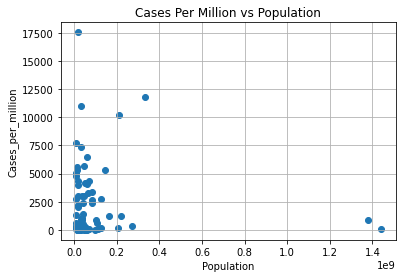

In [55]:
plt.scatter(dc['Population (2020)'],dc['Cases_per_million'])
plt.xlabel('Population')
plt.ylabel('Cases_per_million')
plt.title('Cases Per Million vs Population')
plt.grid()
plt.show()

<b> So the above Chart Gives us a very interesting insight that many countries with lower population have more people affected per million population. </b>  

### <i> Now Let us do a statistical analysis of our data</i>

<b>Total Cases in each Category</b>

In [56]:
%%sql

SELECT SUM(Confirmed), SUM(Deaths), SUM(Recovered),
SUM(Confirmed) - SUM(Deaths) - SUM(Recovered) AS Total_Active

FROM countrywise_data

 * sqlite:///testdb.sqlite
Done.


SUM(Confirmed),SUM(Deaths),SUM(Recovered),Total_Active
14946152,616411,8466313,5863428


In [57]:
sql_2 = """ SELECT SUM(Confirmed), SUM(Deaths), SUM(Recovered),
SUM(Confirmed) - SUM(Deaths) - SUM(Recovered) AS Total_Active FROM countrywise_data"""

In [58]:
aggregate_data = pd.read_sql(sql_2,conn)

In [59]:
aggregate_data

,SUM(Confirmed),SUM(Deaths),SUM(Recovered),Total_Active
0,14946152,616411,8466313,5863428


In [60]:
items = aggregate_data.columns[1:]
values = aggregate_data.values[0][1:]

In [61]:
items

Index(['SUM(Deaths)', 'SUM(Recovered)', 'Total_Active'], dtype='object')

In [62]:
values

array([ 616411, 8466313, 5863428], dtype=int64)

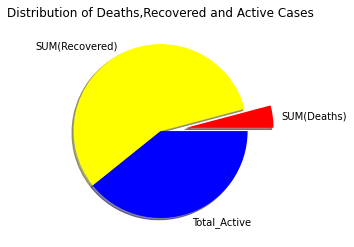

In [63]:
plt.pie(x = values,labels = items,colors = ['red','yellow','blue'],shadow = True,explode = [0.3,0,0])
plt.title('Distribution of Deaths,Recovered and Active Cases')
plt.show()

<b> Average Cases in Countries with More than 10 million population</b>

In [64]:
%%sql

SELECT AVG(Confirmed), AVG(Deaths)
FROM countrywise_data
WHERE `Population (2020)` >= 10000000

 * sqlite:///testdb.sqlite
Done.


AVG(Confirmed),AVG(Deaths)
156808.8764044944,6729.685393258427


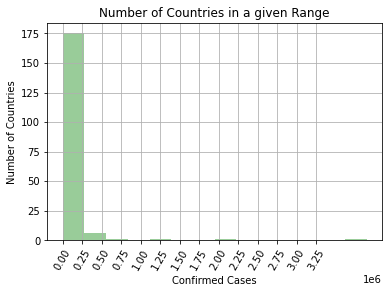

In [65]:
sns.distplot(countrywise_data['Confirmed'],kde = False,bins = 14,color = 'green')
plt.xticks(np.arange(0,3500000,250000),rotation = 60)
plt.xlabel('Confirmed Cases')
plt.ylabel('Number of Countries')
plt.title('Number of Countries in a given Range')
plt.grid()

<b> So, we can clearly see that most of the countries have received cases less than 2.5 lakh (as on July 20)</b>

## Exploring Our Data: Time Series Analysis

Now, we are going to see that how the cases have grown over time in the world and different countries and will be finding some more useful insights.

In [66]:
cumm_data

,Date,Country,Confirmed,Recovered,Deaths
0,2020-01-22,Afghanistan,0,0,0
1,2020-01-22,Albania,0,0,0
2,2020-01-22,Algeria,0,0,0
3,2020-01-22,Andorra,0,0,0
4,2020-01-22,Angola,0,0,0
...,...,...,...,...,...
34211,2020-07-21,West Bank and Gaza,9228,1932,64
34212,2020-07-21,Western Sahara,10,8,1
34213,2020-07-21,Yemen,1629,741,456
34214,2020-07-21,Zambia,3386,1620,128


### <i>Growth Of Total Cases with Time<i/>

In [67]:
df = cumm_data.groupby('Date')['Confirmed'].sum()

In [68]:
df.head()

Date
2020-01-22     555
2020-01-23     654
2020-01-24     941
2020-01-25    1434
2020-01-26    2118
Name: Confirmed, dtype: int64

In [69]:
df.iplot(title = 'Growth of Total Cases with  Time',xTitle = 'Time',yTitle = 'Number of Total Cases')

<b> So, here we see that total cases have grown rapidly since the end of March </b>

### <i> Total Deaths with Time:</i>

In [70]:
df_2 = cumm_data.groupby('Date')['Deaths'].sum()
df_2.head()

Date
2020-01-22    17
2020-01-23    18
2020-01-24    26
2020-01-25    42
2020-01-26    56
Name: Deaths, dtype: int64

In [71]:
df_2.iplot(title = 'Total Deaths with  Time',xTitle = 'Time',yTitle = 'Total Deaths',color = 'red')

###  <i> Death rate and recovery Rate with time:</i>

In [72]:
cumm_data.head()

,Date,Country,Confirmed,Recovered,Deaths
0,2020-01-22,Afghanistan,0,0,0
1,2020-01-22,Albania,0,0,0
2,2020-01-22,Algeria,0,0,0
3,2020-01-22,Andorra,0,0,0
4,2020-01-22,Angola,0,0,0


In [73]:
rate_data = cumm_data.groupby('Date').sum()
rate_data

,Confirmed,Recovered,Deaths
Date,,,
2020-01-22,555,28,17
2020-01-23,654,30,18
2020-01-24,941,36,26
2020-01-25,1434,39,42
2020-01-26,2118,52,56
...,...,...,...
2020-07-17,14055299,7894892,596518
2020-07-18,14292922,8045829,602144
2020-07-19,14507491,8133665,606173


In [74]:
rate_data['Recovery_Rate'] = (rate_data['Recovered']/rate_data['Confirmed'])*100
rate_data['death_Rate'] = (rate_data['Deaths']/rate_data['Confirmed'])*100
rate_data.head()

,Confirmed,Recovered,Deaths,Recovery_Rate,death_Rate
Date,,,,,
2020-01-22,555,28,17,5.045045,3.063063
2020-01-23,654,30,18,4.587156,2.752294
2020-01-24,941,36,26,3.825717,2.763018
2020-01-25,1434,39,42,2.719665,2.928870
2020-01-26,2118,52,56,2.455146,2.644004


In [75]:
rate_data['death_Rate'].iplot(xTitle = 'Time',yTitle = 'Death Rate',title = 'Death Rate with Time',color = 'red')

<b> So, The death rate achieved it's peak on April end at around 7.18% and since then is dropping continuously</b>

In [76]:
rate_data['Recovery_Rate'].iplot(xTitle = 'Time',yTitle = 'Recovery Rate',title = 'Recovery Rate with Time')

### <i> Now let us have a look at everyday cases of the world: </i>

In [77]:
data

,Date,Country,Confirmed,Recovered,Deaths
0,2020-01-23,Afghanistan,0,0,0
1,2020-01-24,Afghanistan,0,0,0
2,2020-01-25,Afghanistan,0,0,0
3,2020-01-26,Afghanistan,0,0,0
4,2020-01-27,Afghanistan,0,0,0
...,...,...,...,...,...
34023,2020-07-17,Zimbabwe,58,13,1
34024,2020-07-18,Zimbabwe,58,1,1
34025,2020-07-19,Zimbabwe,133,33,0
34026,2020-07-20,Zimbabwe,102,0,1


In [78]:
de = data.groupby('Date').sum()

In [79]:
de.head()

,Confirmed,Recovered,Deaths
Date,,,
2020-01-23,99,2,1
2020-01-24,287,6,8
2020-01-25,493,3,16
2020-01-26,684,13,14
2020-01-27,809,9,26


<b> Everyday cases </b>

In [80]:
de['Confirmed'].iplot(title = 'Daily Cases',xTitle = 'Time',yTitle = 'Number of Cases',kind = 'bar')

<b> So, we can see that although the curve is not smooth as number of cases flickers everyday,still the daily cases are increases rapidly every month and it doesn't seem like the pandemic is going to end anytime soon (As on July 20)</b>

<b> Everyday Deaths </b>

In [81]:
de['Deaths'].iplot(title = 'Daily deaths',xTitle = 'Time',yTitle = 'Number of Deaths',color = 'red',kind = 'bar' )

<b> So, the number of deaths per day started to dip from mid April but is flickering heavily since May end (As on July 20)</b>

### <i> Plotting  Cases  and Deaths by Month: </i>

In [82]:
data_2 = data.set_index('Date')
data_2['Month']= data_2.index.to_period('M')
data_2

,Country,Confirmed,Recovered,Deaths,Month
Date,,,,,
2020-01-23,Afghanistan,0,0,0,2020-01
2020-01-24,Afghanistan,0,0,0,2020-01
2020-01-25,Afghanistan,0,0,0,2020-01
2020-01-26,Afghanistan,0,0,0,2020-01
2020-01-27,Afghanistan,0,0,0,2020-01
...,...,...,...,...,...
2020-07-17,Zimbabwe,58,13,1,2020-07
2020-07-18,Zimbabwe,58,1,1,2020-07
2020-07-19,Zimbabwe,133,33,0,2020-07


In [83]:
monthwise_data = data_2.groupby('Month').sum()
monthwise_data

,Confirmed,Recovered,Deaths
Month,,,
2020-01,9372,194,196
2020-02,76082,39560,2729
2020-03,785967,138048,41547
2020-04,2395960,835476,190231
2020-05,2894473,1623890,138902
2020-06,4288047,2716009,137604
2020-07,4496972,3113787,105217


In [84]:
monthwise_data[['Confirmed','Recovered']].iplot(xTitle = 'Month',yTitle = 'Cases',title = 'Monthly Cases And Recovery',kind = 'bar')

In [85]:
monthwise_data['Deaths'].iplot(xTitle = 'Month',yTitle = 'Deaths',title = 'Deaths Every Month',kind = 'bar',color = 'red')

### <i> Plotting Cases and Deaths Every Week: </i>

In [86]:
data_2['Week']= data_2.index.to_period('W')
data_2

,Country,Confirmed,Recovered,Deaths,Month,Week
Date,,,,,,
2020-01-23,Afghanistan,0,0,0,2020-01,2020-01-20/2020-01-26
2020-01-24,Afghanistan,0,0,0,2020-01,2020-01-20/2020-01-26
2020-01-25,Afghanistan,0,0,0,2020-01,2020-01-20/2020-01-26
2020-01-26,Afghanistan,0,0,0,2020-01,2020-01-20/2020-01-26
2020-01-27,Afghanistan,0,0,0,2020-01,2020-01-27/2020-02-02
...,...,...,...,...,...,...
2020-07-17,Zimbabwe,58,13,1,2020-07,2020-07-13/2020-07-19
2020-07-18,Zimbabwe,58,1,1,2020-07,2020-07-13/2020-07-19
2020-07-19,Zimbabwe,133,33,0,2020-07,2020-07-13/2020-07-19


In [87]:
weekly_data = data_2.groupby('Week').sum()

In [88]:
weekly_data

,Confirmed,Recovered,Deaths
Week,,,
2020-01-20/2020-01-26,1563,24,39
2020-01-27/2020-02-02,14669,420,306
2020-02-03/2020-02-09,23372,2772,544
2020-02-10/2020-02-16,31075,7621,864
2020-02-17/2020-02-23,7745,12529,700
2020-02-24/2020-03-01,9407,19322,526
2020-03-02/2020-03-08,21574,17978,807
2020-03-09/2020-03-15,58981,15338,2668
2020-03-16/2020-03-22,173314,21853,8369


In [89]:
weekly_data[['Confirmed','Recovered']].iplot(title = 'Weekly Cases and Recovery',xTitle = 'Week',yTitle = 'Cases',kind = 'bar')

In [90]:
weekly_data['Deaths'].iplot(title = 'Weekly Deaths',xTitle = 'Week',yTitle = 'Cases',kind = 'bar',color = 'red')

### <i> Daily Average Cases per Month: </i>

In this section we see how number of cases reported daily grew every month 

In [91]:
data_3 = data.groupby('Date').sum()
data_3

,Confirmed,Recovered,Deaths
Date,,,
2020-01-23,99,2,1
2020-01-24,287,6,8
2020-01-25,493,3,16
2020-01-26,684,13,14
2020-01-27,809,9,26
...,...,...,...
2020-07-17,241966,183365,6742
2020-07-18,237623,150937,5626
2020-07-19,214569,87836,4029


In [92]:
data_3['Month'] = data_3.index.to_period('M')
data_3

,Confirmed,Recovered,Deaths,Month
Date,,,,
2020-01-23,99,2,1,2020-01
2020-01-24,287,6,8,2020-01
2020-01-25,493,3,16,2020-01
2020-01-26,684,13,14,2020-01
2020-01-27,809,9,26,2020-01
...,...,...,...,...
2020-07-17,241966,183365,6742,2020-07
2020-07-18,237623,150937,5626,2020-07
2020-07-19,214569,87836,4029,2020-07


In [93]:
data_3 = data_3.groupby('Month').mean()
data_3 = data_3.astype(int)
data_3

,Confirmed,Recovered,Deaths
Month,,,
2020-01,1041,21,21
2020-02,2623,1364,94
2020-03,25353,4453,1340
2020-04,79865,27849,6341
2020-05,93370,52383,4480
2020-06,142934,90533,4586
2020-07,214141,148275,5010


In [94]:
data_3['Confirmed'].iplot(title=' Average Daily Cases Every Month',xTitle='Month',yTitle='Avg Cases Per Day',kind='bar')

<b> So, it's clear that on an average we are witnessing more than 2 lakh cases per day in the month of July. </b> 

##  Time Series Analysis for a Single Country 
Now we are going  do every kind of time series analysis for a single country that we have done in the above section for the whole world. 

In [95]:
countrywise_data

,Country,Confirmed,Recovered,Deaths,Population (2020)
0,Afghanistan,35615,23741,1186,38742911
1,Albania,4290,2397,117,2878420
2,Algeria,24278,16646,1100,43685618
3,Andorra,884,803,52,77240
4,Angola,779,221,30,32644783
...,...,...,...,...,...
180,West Bank and Gaza,9228,1932,64,4685306
181,Western Sahara,10,8,1,594215
182,Yemen,1629,741,456,29687214
183,Zambia,3386,1620,128,18273379


In [96]:
class Country_Analysis:
    
    def __init__(self,country,data = data,countrywise_data=countrywise_data,cumm_data = cumm_data): #passing our 3 tables to the class
        self.country = country
        
        self.confirmed_cases = int(countrywise_data[countrywise_data.Country == self.country]['Confirmed'])
        self.total_deaths = int(countrywise_data[countrywise_data.Country == self.country]['Deaths'])
        self.total_recovery = int(countrywise_data[countrywise_data.Country == self.country]['Recovered'])
        self.active_cases = self.confirmed_cases - self.total_deaths - self.total_recovery
        self.death_rate = str(round((self.total_deaths/self.confirmed_cases)*100,2)) + '%'
        self.recovery_rate = str(round((self.total_recovery/self.confirmed_cases)*100,2)) + '%'
        self.population  = int(countrywise_data[countrywise_data.Country == self.country]['Population (2020)']) 
        self.cases_per_million = int(self.confirmed_cases*1000000/self.population)
        
    # Time Series Plotting
    
    def plot_total_cases_with_time(self):
        df = cumm_data[cumm_data.Country == self.country].set_index('Date')
        
        df['Confirmed'].iplot(yTitle = 'Number of Total Cases',xTitle = 'Time',title = 'Growth of Total Cases with Time for {}'.format(self.country))
        
    def plot_deaths_with_time(self):
        df = cumm_data[cumm_data.Country == self.country].set_index('Date')
        
        df['Deaths'].iplot(yTitle = ' Total Deaths',xTitle = 'Time',title = 'Total Deaths with Time for {}'.format(self.country),color = 'red')
        
    def plot_death_rate_with_time(self):
        df = cumm_data[cumm_data.Country == self.country].set_index('Date')
        df['death_rate'] = round(df.Deaths*100/df.Confirmed,2)
        
        df['death_rate'].iplot(yTitle = 'Death Rate',xTitle = 'Time',title = 'Death Rate with Time for {}'.format(self.country),color = 'red')
        
    def plot_recovery_rate_with_time(self):
        df = cumm_data[cumm_data.Country == self.country].set_index('Date')
        df['recovery_rate'] = round(df.Recovered*100/df.Confirmed,2)
        
        df['recovery_rate'].iplot(yTitle = 'Recovery Rate',xTitle = 'Time',title = 'Recovery Rate with Time for {}'.format(self.country))
        
    def plot_daily_cases(self):
        df = data[data.Country == self.country].set_index('Date')
        
        df['Confirmed'].iplot(yTitle = 'Number of Cases',xTitle = 'Time',title = 'Daily Cases for {}'.format(self.country),kind = 'bar')
    
    def plot_daily_deaths(self):
        df = data[data.Country == self.country].set_index('Date')
        
        df['Deaths'].iplot(yTitle = 'Number of Deaths',xTitle = 'Time',title = 'Daily Deaths for {}'.format(self.country),kind = 'bar',color = 'red')
        
    def plot_monthly_cases_and_recovery(self):
        df = data[data.Country == self.country].set_index('Date')
        df['Month'] = df.index.to_period('M')
        df = df.groupby('Month').sum()
        
        df[['Confirmed','Recovered']].iplot(xTitle = 'Month',yTitle = 'Cases',title = 'Monthly Cases and Recovery for {}'.format(self.country),kind = 'bar')
        
    def plot_monthly_deaths(self):
        df = data[data.Country == self.country].set_index('Date')
        df['Month'] = df.index.to_period('M')
        df = df.groupby('Month').sum()
        
        df['Deaths'].iplot(xTitle = 'Month',yTitle = 'Deaths',title = 'Deaths Every Month for {}'.format(self.country),color = 'red',kind = 'bar')
        
    def plot_weekly_cases_and_recovery(self):
        df = data[data.Country == self.country].set_index('Date')
        df['Week'] = df.index.to_period('W')
        df = df.groupby('Week').sum()
        
        df[['Confirmed','Recovered']].iplot(xTitle = 'Week',yTitle = 'Cases',title = 'Weekly Cases and Recovery for {}'.format(self.country),kind = 'bar')
        
    def plot_weekly_deaths(self):
        df = data[data.Country == self.country].set_index('Date')
        df['Week'] = df.index.to_period('W')
        df = df.groupby('Week').sum()
        
        df['Deaths'].iplot(xTitle = 'Week',yTitle = 'Deaths',title = 'Weekly Deaths for {}'.format(self.country),kind = 'bar',color = 'red')
        
    
    def plot_average_daily_cases_every_month(self):
        df = data[data.Country == self.country].set_index('Date')
        df['Month'] = df.index.to_period('M')
        df = df.groupby('Month').mean()
        df = df.astype(int)
        
        df['Confirmed'].iplot(xTitle = 'Month',yTitle = 'Avg Cases Per Day ',title = 'Average Daily Cases Every Month for {}'.format(self.country),kind = 'bar')

<b> Here, We have created a class named as <i>Country_Analysis</i>. We can create an object of this class for any country by passing the name of the country in the constructor. By creating an object, we can get the following information for any country using the member variables.</b>

- Confirmed Cases
- Total Deaths
- Total Recovery
- Active Cases
- Death Rate
- Recovery Rate
- Population
- Cases Per Million People

<b> We can also plot the following graphs showing the trends in data with time using the member functions.</b>

- Total Cases with Time
- Deaths with Time
- Death Rate with Time
- Recovery Rate with Time
- Daily Cases
- Daily Deaths
- Monthly Cases And Recovery
- Monthly Deaths
- Weekly Cases and Recovery
- Weekly Deaths
- Daily Average Cases Every Month

In [97]:
for country in data.Country.unique():
    print(country)

Afghanistan
Albania
Algeria
Andorra
Angola
Antigua and Barbuda
Argentina
Armenia
Australia
Austria
Azerbaijan
Bahamas
Bahrain
Bangladesh
Barbados
Belarus
Belgium
Belize
Benin
Bhutan
Bolivia
Bosnia and Herzegovina
Botswana
Brazil
Brunei
Bulgaria
Burkina Faso
Burma
Burundi
Cabo Verde
Cambodia
Cameroon
Canada
Central African Republic
Chad
Chile
China
Colombia
Comoros
Congo (Brazzaville)
Congo (Kinshasa)
Costa Rica
Cote d'Ivoire
Croatia
Cuba
Cyprus
Czechia
Denmark
Diamond Princess
Djibouti
Dominica
Dominican Republic
Ecuador
Egypt
El Salvador
Equatorial Guinea
Eritrea
Estonia
Eswatini
Ethiopia
Fiji
Finland
France
Gabon
Gambia
Georgia
Germany
Ghana
Greece
Grenada
Guatemala
Guinea
Guinea-Bissau
Guyana
Haiti
Holy See
Honduras
Hungary
Iceland
India
Indonesia
Iran
Iraq
Ireland
Israel
Italy
Jamaica
Japan
Jordan
Kazakhstan
Kenya
Korea, South
Kosovo
Kuwait
Kyrgyzstan
Laos
Latvia
Lebanon
Lesotho
Liberia
Libya
Liechtenstein
Lithuania
Luxembourg
MS Zaandam
Madagascar
Malawi
Malaysia
Maldives
Mali
Mal

<b> We can create a Country_Analysis class for any of the above countries and obtain the desired insights.</b>

## Case Study
### India vs United Kingdom :

Now, we are going to do a case study by comparing the data for India and United Kingdom. First we will see some insights for India and plot some interesting graphs. Then we will do the same for United Kingdom. We use the <b>Country_Analysis class</b> that we have just created for our analysis. 

In [98]:
#Let us first create an object
ind = Country_Analysis('India')

In [99]:
ind.confirmed_cases

1193078

In [100]:
ind.total_deaths

28732

In [101]:
ind.total_recovery

753050

In [102]:
ind.active_cases

411296

In [103]:
ind.death_rate

'2.41%'

In [104]:
ind.recovery_rate

'63.12%'

In [105]:
ind.population

1377233523

In [106]:
ind.cases_per_million

866

<b>Now, Let us make some visualisations for India to see the trends in it's cases</b>

In [107]:
ind.plot_total_cases_with_time()

In [108]:
ind.plot_deaths_with_time()

In [109]:
ind.plot_death_rate_with_time()

It's a good sign that death rate is decreasing continuously since mid June (As on 20th July)

In [110]:
ind.plot_recovery_rate_with_time()

In [111]:
ind.plot_daily_cases()

Daily Cases are increasing rapidly in India as on 20th July. The pandemic doesn't seem to slow down anytime soon.

In [112]:
ind.plot_daily_deaths()

In [113]:
ind.plot_monthly_cases_and_recovery()

Every Month we are witnessing more number of cases than the previous month and this is an alarming sign. (as on 20th July)

In [114]:
ind.plot_monthly_deaths()

In [115]:
ind.plot_weekly_cases_and_recovery()

In [116]:
ind.plot_weekly_deaths()

In [117]:
ind.plot_average_daily_cases_every_month()

So, we are witnessing more than 28k cases per day on an average in the month of July which is more than double than that in previous month in India.

#### <b> Now, Let us do a similar Analysis and Visualization for <u>United Kingdom.<u/></b>

In [118]:
#First we will create an object UK like we did it for India
uk = Country_Analysis('United Kingdom')

In [119]:
uk.confirmed_cases

297389

In [120]:
uk.total_deaths

45507

In [121]:
uk.total_recovery

1414

In [122]:
uk.active_cases

250468

In [123]:
uk.death_rate

'15.3%'

In [124]:
uk.recovery_rate

'0.48%'

United Kingdom has a very high death rate and very poor recovery rate. (As on 20th July)

In [125]:
uk.population

67814098

In [126]:
uk.cases_per_million

4385

In [127]:
uk.plot_total_cases_with_time()

The cases started to increase rapidly in the end of March but now it seems that they are increasing slowly for United Kingdom.(As on 20th July)

In [128]:
uk.plot_deaths_with_time()

In [129]:
uk.plot_death_rate_with_time()

Death rate seems to have become stable at around 15% since the beginning of May.(As on 20th July)

In [130]:
uk.plot_recovery_rate_with_time()

Recovery rate is very low and doesn't seem to improve at all for United Kingdom (as on 20th July)

In [131]:
uk.plot_daily_cases()

Daily Cases are showing a downward trend for UK  since May and now have become stable (As on 20th July)

In [132]:
uk.plot_daily_deaths()

In [133]:
uk.plot_monthly_cases_and_recovery()

Although the monthly cases are going down but the recovered cases compared to the confirmed cases seems negligible for UK(as on 20th July)

In [134]:
uk.plot_monthly_deaths()

In [135]:
uk.plot_weekly_cases_and_recovery()

In [136]:
uk.plot_weekly_deaths()

In [137]:
uk.plot_average_daily_cases_every_month()

So, we can conclude that although UK is doing good to restrict the number of cases everyday, it still needs to work upon it's recovery rate. (As on 20th July)

### <i>Conclusion:</i>
From the analysis of India and United Kingdom we can say that both the countries are quiet trending in an opposite fashion:

- <b>Although India has a good recovery rate and low death rate, it still needs to reduce the growth of number of cases. </b>
- <b>United Kingdom has done a good job in restricting the number of cases witnessed everyday but it still needs to work upon improving the recovery rate and lowering down the death rate.</b>

## Geographical Plotting 
In this section we will map the spread of COVID-19. We will create a choropleth map using plotly. We will be able to see slide over a timeline to see the total cases,deaths and active cases  in different countries with time.

In [138]:
countries = list(cumm_data.Country.unique())

In [139]:
countries

['Afghanistan',
 'Albania',
 'Algeria',
 'Andorra',
 'Angola',
 'Antigua and Barbuda',
 'Argentina',
 'Armenia',
 'Australia',
 'Austria',
 'Azerbaijan',
 'Bahamas',
 'Bahrain',
 'Bangladesh',
 'Barbados',
 'Belarus',
 'Belgium',
 'Belize',
 'Benin',
 'Bhutan',
 'Bolivia',
 'Bosnia and Herzegovina',
 'Botswana',
 'Brazil',
 'Brunei',
 'Bulgaria',
 'Burkina Faso',
 'Burma',
 'Burundi',
 'Cabo Verde',
 'Cambodia',
 'Cameroon',
 'Canada',
 'Central African Republic',
 'Chad',
 'Chile',
 'China',
 'Colombia',
 'Comoros',
 'Congo (Brazzaville)',
 'Congo (Kinshasa)',
 'Costa Rica',
 "Cote d'Ivoire",
 'Croatia',
 'Cuba',
 'Cyprus',
 'Czechia',
 'Denmark',
 'Diamond Princess',
 'Djibouti',
 'Dominica',
 'Dominican Republic',
 'Ecuador',
 'Egypt',
 'El Salvador',
 'Equatorial Guinea',
 'Eritrea',
 'Estonia',
 'Eswatini',
 'Ethiopia',
 'Fiji',
 'Finland',
 'France',
 'Gabon',
 'Gambia',
 'Georgia',
 'Germany',
 'Ghana',
 'Greece',
 'Grenada',
 'Guatemala',
 'Guinea',
 'Guinea-Bissau',
 'Guyana',

In [140]:
country_codes = {}

In [141]:
pycountry.countries.search_fuzzy('India')

[Country(alpha_2='IN', alpha_3='IND', name='India', numeric='356', official_name='Republic of India'),
 Country(alpha_2='IO', alpha_3='IOT', name='British Indian Ocean Territory', numeric='086'),
 Country(alpha_2='GN', alpha_3='GIN', name='Guinea', numeric='324', official_name='Republic of Guinea'),
 Country(alpha_2='US', alpha_3='USA', name='United States', numeric='840', official_name='United States of America')]

 We can get the ISO 3 code of India by taking the alpha_3 attribute of 
of the first element of the list. Similarly, we can do it for any country

In [142]:
for country in countries:
    try:
        country_data = pycountry.countries.search_fuzzy(country)
        country_code = country_data[0].alpha_3
        country_codes.update({country:country_code})
        
    except:
        print('Unable to find ISO 3 code for',country)
        country_codes.update({country: " "})

Unable to find ISO 3 code for Burma
Unable to find ISO 3 code for Congo (Brazzaville)
Unable to find ISO 3 code for Congo (Kinshasa)
Unable to find ISO 3 code for Diamond Princess
Unable to find ISO 3 code for Korea, South
Unable to find ISO 3 code for Laos
Unable to find ISO 3 code for MS Zaandam
Unable to find ISO 3 code for Taiwan*
Unable to find ISO 3 code for West Bank and Gaza


In [143]:
country_codes

{'Afghanistan': 'AFG',
 'Albania': 'ALB',
 'Algeria': 'DZA',
 'Andorra': 'AND',
 'Angola': 'AGO',
 'Antigua and Barbuda': 'ATG',
 'Argentina': 'ARG',
 'Armenia': 'ARM',
 'Australia': 'AUS',
 'Austria': 'AUT',
 'Azerbaijan': 'AZE',
 'Bahamas': 'BHS',
 'Bahrain': 'BHR',
 'Bangladesh': 'BGD',
 'Barbados': 'BRB',
 'Belarus': 'BLR',
 'Belgium': 'BEL',
 'Belize': 'BLZ',
 'Benin': 'BEN',
 'Bhutan': 'BTN',
 'Bolivia': 'BOL',
 'Bosnia and Herzegovina': 'BIH',
 'Botswana': 'BWA',
 'Brazil': 'BRA',
 'Brunei': 'BRN',
 'Bulgaria': 'BGR',
 'Burkina Faso': 'BFA',
 'Burma': ' ',
 'Burundi': 'BDI',
 'Cabo Verde': 'CPV',
 'Cambodia': 'KHM',
 'Cameroon': 'CMR',
 'Canada': 'CAN',
 'Central African Republic': 'CAF',
 'Chad': 'TCD',
 'Chile': 'CHL',
 'China': 'CHN',
 'Colombia': 'COL',
 'Comoros': 'COM',
 'Congo (Brazzaville)': ' ',
 'Congo (Kinshasa)': ' ',
 'Costa Rica': 'CRI',
 "Cote d'Ivoire": 'CIV',
 'Croatia': 'HRV',
 'Cuba': 'CUB',
 'Cyprus': 'CYP',
 'Czechia': 'CZE',
 'Denmark': 'DNK',
 'Diamond Pri

In [144]:
country_codes['Korea, South'] = 'KOR'
country_codes['Laos'] = 'LAO'
country_codes['Taiwan*'] = 'TWN'
country_codes['Burma'] = 'MMR'

#source = https://www.iban.com/country-codes             

In [145]:
for country,code in country_codes.items():
    cumm_data.loc[(cumm_data.Country == country),'iso_code'] = code

In [146]:
cumm_data['Date'] = cumm_data['Date'].astype(str)
cumm_data['Active'] = cumm_data['Confirmed'] - cumm_data['Recovered'] - cumm_data['Deaths']
cumm_data.head()

,Date,Country,Confirmed,Recovered,Deaths,iso_code,Active
0,2020-01-22,Afghanistan,0,0,0,AFG,0
1,2020-01-22,Albania,0,0,0,ALB,0
2,2020-01-22,Algeria,0,0,0,DZA,0
3,2020-01-22,Andorra,0,0,0,AND,0
4,2020-01-22,Angola,0,0,0,AGO,0


### <i> Total Cases with Time: </i>

In [147]:
confirmed = px.choropleth(data_frame = cumm_data,
                    locations = 'iso_code',
                    color = 'Confirmed',
                    hover_name = 'Country',
                    animation_frame = 'Date',
                    color_continuous_scale=px.colors.sequential.Cividis_r,
                    title = 'Total Cases with Time')

In [148]:
confirmed.show()

### <i>Deaths with Time: </i>

In [149]:
deaths = px.choropleth(data_frame = cumm_data,
                    locations = 'iso_code',
                    color = 'Deaths',
                    hover_name = 'Country',
                    animation_frame = 'Date',
                    color_continuous_scale=px.colors.sequential.Cividis_r,
                    title = 'Deaths with Time')

In [150]:
deaths.show()

### <i> Active Cases With Time </i>

In [151]:
active = px.choropleth(data_frame = cumm_data,
                    locations = 'iso_code',
                    color = 'Active',
                    hover_name = 'Country',
                    animation_frame = 'Date',
                    color_continuous_scale=px.colors.sequential.Cividis_r,
                    title = 'Active Cases with Time')

In [152]:
active.show()

 ### <b> So, a similar kind of exploratory data analysis can be done for any country by creating it's object. </b>

## Sources of Information:

- Github(https://raw.githubusercontent.com/datasets/covid-19/master/data/countries-aggregated.csv) <b>COVID-19 Dataset</b>

- Kaggle(https://storage.googleapis.com/kagglesdsdata/datasets%2F507962%2F1091873%2Fpopulation_by_country_2020.csv?GoogleAccessId=gcp-kaggle-com@kaggle-161607.iam.gserviceaccount.com&Expires=1595270051&Signature=mK1oPQURDJkvTqkvCEVR09uAueB1eQJDPL0%2B2E7XOtIM1YM3oRnRU%2FQ0UanT3mG0l1xX1OxwU4RBzCrus4hi4qzwIe7CAwTyf6d0drkL8vzJ8v%2Buit%2B9nEEoyuNiM6vRzBd9vJZcxryIXaXNOSAXNSWJwLSQG02EL4LOHCmxal4t08UvXcIQ4lEenxJuDOIEzk9VMByWdgfKudhgp7xW5C%2F%2Ffwc5%2FwtMiI31Kct8LHBgh5aobgjkyl2zyCg5pvu%2Bz%2FZulaUeij3bR5l3gkGr77wolhl35nTEvgUS7a4c5U9yHMoTkD9M6oiHJvUnYHP97kUuawhgvkBZcrNRn3LiAA%3D%3D) <b>Population Dataset</b>

- Wikipedia

- World Bank

- https://plotly.com/python/colorscales/ (for choosing the best color scale)

- https://www.iban.com/country-codes (for seeing country codes of some countries)